In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from IPython.display import Markdown, display
from sklearn.linear_model import LogisticRegression 
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier 
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.preprocessing import label_binarize
import warnings 
warnings.filterwarnings('ignore')
import logging
logging.getLogger('matplotlib.font_manager').disabled = True

def printmd(string):
    display(Markdown(string))

# Load the dataset

df = pd.read_csv("credit_train.csv")
df.head()

,Loan ID,Customer ID,Loan Status,Current Loan Amount,Term,Credit Score,Annual Income,Years in current job,Home Ownership,Purpose,Monthly Debt,Years of Credit History,Months since last delinquent,Number of Open Accounts,Number of Credit Problems,Current Credit Balance,Maximum Open Credit,Bankruptcies,Tax Liens
0,14dd8831-6af5-400b-83ec-68e61888a048,981165ec-3274-42f5-a3b4-d104041a9ca9,Fully Paid,445412.0,Short Term,709.0,1167493.0,8 years,Home Mortgage,Home Improvements,5214.74,17.2,NaN,6.0,1.0,228190.0,416746.0,1.0,0.0
1,4771cc26-131a-45db-b5aa-537ea4ba5342,2de017a3-2e01-49cb-a581-08169e83be29,Fully Paid,262328.0,Short Term,NaN,NaN,10+ years,Home Mortgage,Debt Consolidation,33295.98,21.1,8.0,35.0,0.0,229976.0,850784.0,0.0,0.0
2,4eed4e6a-aa2f-4c91-8651-ce984ee8fb26,5efb2b2b-bf11-4dfd-a572-3761a2694725,Fully Paid,99999999.0,Short Term,741.0,2231892.0,8 years,Own Home,Debt Consolidation,29200.53,14.9,29.0,18.0,1.0,297996.0,750090.0,0.0,0.0
3,77598f7b-32e7-4e3b-a6e5-06ba0d98fe8a,e777faab-98ae-45af-9a86-7ce5b33b1011,Fully Paid,347666.0,Long Term,721.0,806949.0,3 years,Own Home,Debt Consolidation,8741.90,12.0,NaN,9.0,0.0,256329.0,386958.0,0.0,0.0
4,d4062e70-befa-4995-8643-a0de73938182,81536ad9-5ccf-4eb8-befb-47a4d608658e,Fully Paid,176220.0,Short Term,NaN,NaN,5 years,Rent,Debt Consolidation,20639.70,6.1,NaN,15.0,0.0,253460.0,427174.0,0.0,0.0


In [2]:
df["Loan Status"].map({"Fully Paid": 1, "Charged Off": 0})

0         1.0
1         1.0
2         1.0
3         1.0
4         1.0
         ... 
100509    NaN
100510    NaN
100511    NaN
100512    NaN
100513    NaN
Name: Loan Status, Length: 100514, dtype: float64

In [3]:
# Shape of dataset
print('Rows: {} Columns: {}'.format(df.shape[0], df.shape[1]))

Rows: 100514 Columns: 19


In [4]:
df.drop_duplicates(inplace=True)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 89786 entries, 0 to 100000
Data columns (total 19 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Loan ID                       89785 non-null  object 
 1   Customer ID                   89785 non-null  object 
 2   Loan Status                   89785 non-null  object 
 3   Current Loan Amount           89785 non-null  float64
 4   Term                          89785 non-null  object 
 5   Credit Score                  70631 non-null  float64
 6   Annual Income                 70631 non-null  float64
 7   Years in current job          85983 non-null  object 
 8   Home Ownership                89785 non-null  object 
 9   Purpose                       89785 non-null  object 
 10  Monthly Debt                  89785 non-null  float64
 11  Years of Credit History       89785 non-null  float64
 12  Months since last delinquent  41448 non-null  float64
 13  

In [6]:
df.describe()

,Current Loan Amount,Credit Score,Annual Income,Monthly Debt,Years of Credit History,Months since last delinquent,Number of Open Accounts,Number of Credit Problems,Current Credit Balance,Maximum Open Credit,Bankruptcies,Tax Liens
count,8.978500e+04,70631.000000,7.063100e+04,89785.000000,89785.000000,41448.000000,89785.000000,89785.000000,8.978500e+04,8.978300e+04,89595.000000,89776.000000
mean,1.306089e+07,1130.830598,1.375894e+06,18396.906410,18.248642,34.975873,11.123250,0.164983,2.940351e+05,7.756565e+05,0.115531,0.028605
std,3.329556e+07,1571.037395,1.104852e+06,12145.282372,7.034607,22.008585,4.998884,0.478010,3.722277e+05,8.803517e+06,0.347919,0.255108
min,1.080200e+04,585.000000,7.662700e+04,0.000000,3.600000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000
25%,1.802680e+05,708.000000,8.479320e+05,10157.400000,13.500000,16.000000,8.000000,0.000000,1.129360e+05,2.770680e+05,0.000000,0.000000
50%,3.138740e+05,729.000000,1.168975e+06,16140.310000,17.000000,32.000000,10.000000,0.000000,2.097220e+05,4.726920e+05,0.000000,0.000000
75%,5.323780e+05,742.000000,1.648915e+06,23918.910000,21.700000,51.000000,14.000000,0.000000,3.675170e+05,7.914500e+05,0.000000,0.000000
max,1.000000e+08,7510.000000,1.655574e+08,435843.280000,70.500000,176.000000,76.000000,15.000000,3.287897e+07,1.539738e+09,7.000000,15.000000


In [7]:
# Check for null values
round((df.isnull().sum() / df.shape[0]) * 100, 2).astype(str) + ' %'

Loan ID                           0.0 %
Customer ID                       0.0 %
Loan Status                       0.0 %
Current Loan Amount               0.0 %
Term                              0.0 %
Credit Score                    21.33 %
Annual Income                   21.33 %
Years in current job             4.24 %
Home Ownership                    0.0 %
Purpose                           0.0 %
Monthly Debt                      0.0 %
Years of Credit History           0.0 %
Months since last delinquent    53.84 %
Number of Open Accounts           0.0 %
Number of Credit Problems         0.0 %
Current Credit Balance            0.0 %
Maximum Open Credit               0.0 %
Bankruptcies                     0.21 %
Tax Liens                        0.01 %
dtype: object

In [8]:
loan = df['Loan Status'].value_counts(normalize=True)
round(loan * 100, 2).astype('str') + ' %'

Fully Paid     74.79 %
Charged Off    25.21 %
Name: Loan Status, dtype: object

In [9]:
na = df[df['Loan ID'].isnull()].index.tolist()
df.drop(na, inplace=True)

## Visualizition of the data 

<Axes: ylabel='Loan Status'>

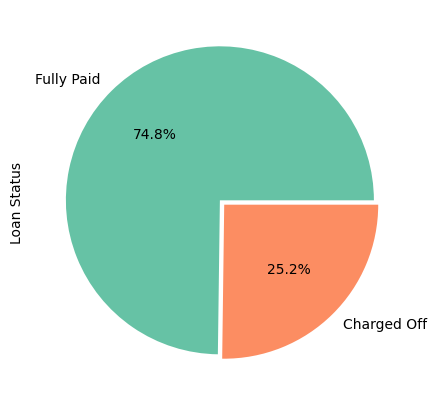

In [10]:
round(df["Loan Status"].value_counts()/ df.shape[0]*100,2).plot.pie(autopct = '%1.1f%%',figsize =(5, 5),explode=(0.02,0.02),colors=sns.color_palette("Set2"))

## Correlation Matrix

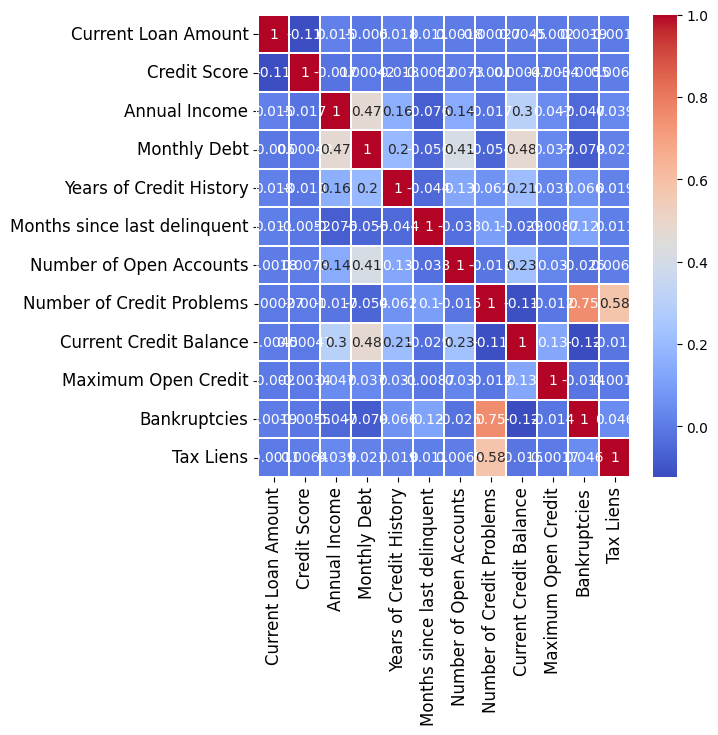

We can see that we have a few features that are highly correlated with each other.

In [11]:
printmd('## Correlation Matrix')

corr = df.corr()
plt.figure(figsize=(6,6))
sns.heatmap(corr, annot=True, cmap='coolwarm', linewidths=0.2)
fig=plt.gcf()
fig.set_size_inches(6,6)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()


printmd('We can see that we have a few features that are highly correlated with each other.')



<Axes: xlabel='Term', ylabel='count'>

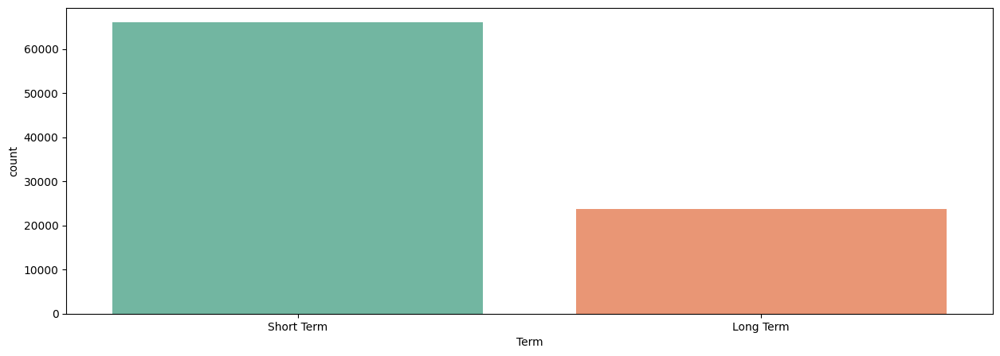

In [12]:
plt.figure(figsize = (15,5))
sns.countplot(x= df["Term"], palette="Set2")

<Axes: xlabel='Years in current job', ylabel='count'>

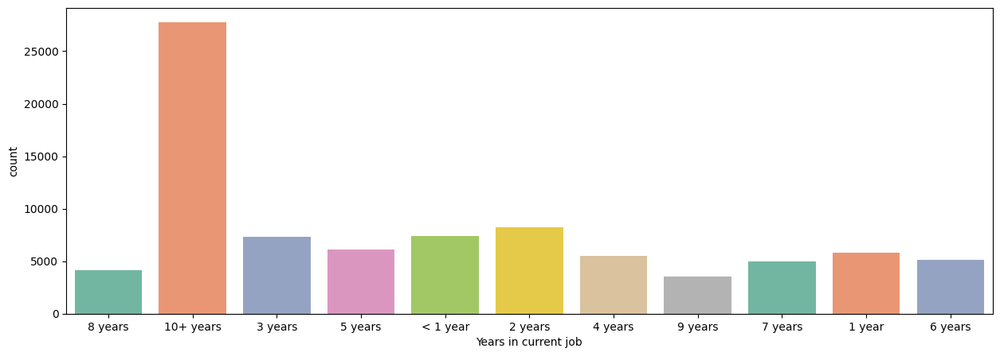

In [13]:
plt.figure(figsize = (15,5))
sns.countplot(x= df["Years in current job"], palette="Set2")

<Axes: xlabel='Home Ownership', ylabel='count'>

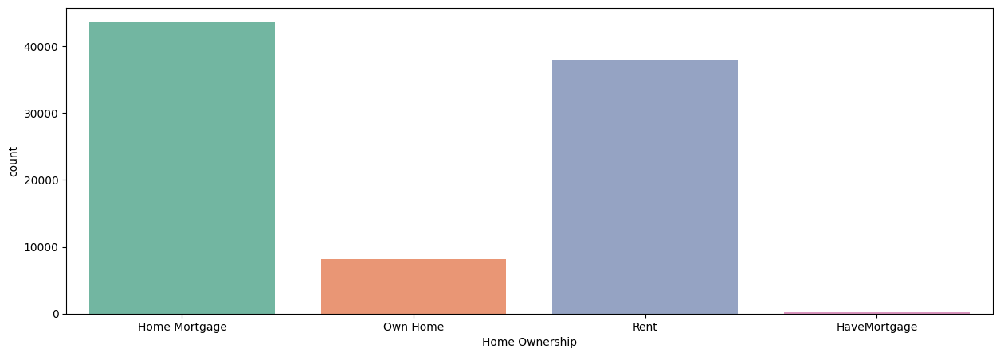

In [14]:
plt.figure(figsize = (15,5))
sns.countplot(x= df["Home Ownership"], palette="Set2")

In [15]:
import plotly.express as px

In [16]:
fig = px.histogram(df, x="Current Loan Amount", marginal="box", color = "Loan Status")
fig.show()

In [17]:
fig = px.histogram(df, x="Credit Score", marginal="box", color = "Loan Status")
fig.show()

In [18]:
fig = px.histogram(df, x="Annual Income", marginal="box", color = "Loan Status")
fig.show()

In [19]:
fig = px.histogram(df, x="Monthly Debt", marginal="box", color = "Loan Status")
fig.show()

In [20]:
fig = px.histogram(df, x="Years of Credit History", marginal="box", color = "Loan Status")
fig.show()

## Hendel the missing values

In [21]:
df = df.drop(['Months since last delinquent'], axis=1)
df.dropna(thresh=13, inplace=True)
mapping_dict = {
    "Years in current job": {
        "10+ years": 10,
        "9 years": 9,
        "8 years": 8,
        "7 years": 7,
        "6 years": 6,
        "5 years": 5,
        "4 years": 4,
        "3 years": 3,
        "2 years": 2,
        "1 year": 1,
        "< 1 year": 0
    }
}

df.replace(mapping_dict, inplace=True)
df["Years in current job"].fillna(0, inplace=True)

In [22]:
category_cols = df.select_dtypes(include=['object']).columns 
for col in category_cols:
    df[col] = df[col].astype('category')
    df[col].fillna(df[col].mode()[0], inplace=True)
    # df[col] = df[col].cat.codes 

In [23]:
numeric_cols = df.select_dtypes(include=['int64','float64']).columns 
for col in numeric_cols:
    df[col].fillna(df[col].mean(), inplace=True)
df.head()

,Loan ID,Customer ID,Loan Status,Current Loan Amount,Term,Credit Score,Annual Income,Years in current job,Home Ownership,Purpose,Monthly Debt,Years of Credit History,Number of Open Accounts,Number of Credit Problems,Current Credit Balance,Maximum Open Credit,Bankruptcies,Tax Liens
0,14dd8831-6af5-400b-83ec-68e61888a048,981165ec-3274-42f5-a3b4-d104041a9ca9,Fully Paid,445412.0,Short Term,709.000000,1.167493e+06,8.0,Home Mortgage,Home Improvements,5214.74,17.2,6.0,1.0,228190.0,416746.0,1.0,0.0
1,4771cc26-131a-45db-b5aa-537ea4ba5342,2de017a3-2e01-49cb-a581-08169e83be29,Fully Paid,262328.0,Short Term,1130.830598,1.375894e+06,10.0,Home Mortgage,Debt Consolidation,33295.98,21.1,35.0,0.0,229976.0,850784.0,0.0,0.0
2,4eed4e6a-aa2f-4c91-8651-ce984ee8fb26,5efb2b2b-bf11-4dfd-a572-3761a2694725,Fully Paid,99999999.0,Short Term,741.000000,2.231892e+06,8.0,Own Home,Debt Consolidation,29200.53,14.9,18.0,1.0,297996.0,750090.0,0.0,0.0
3,77598f7b-32e7-4e3b-a6e5-06ba0d98fe8a,e777faab-98ae-45af-9a86-7ce5b33b1011,Fully Paid,347666.0,Long Term,721.000000,8.069490e+05,3.0,Own Home,Debt Consolidation,8741.90,12.0,9.0,0.0,256329.0,386958.0,0.0,0.0
4,d4062e70-befa-4995-8643-a0de73938182,81536ad9-5ccf-4eb8-befb-47a4d608658e,Fully Paid,176220.0,Short Term,1130.830598,1.375894e+06,5.0,Rent,Debt Consolidation,20639.70,6.1,15.0,0.0,253460.0,427174.0,0.0,0.0


In [24]:
df.shape

(89785, 18)

In [25]:
pd.options.display.float_format = '{:.2f}'.format

## Label encoding 

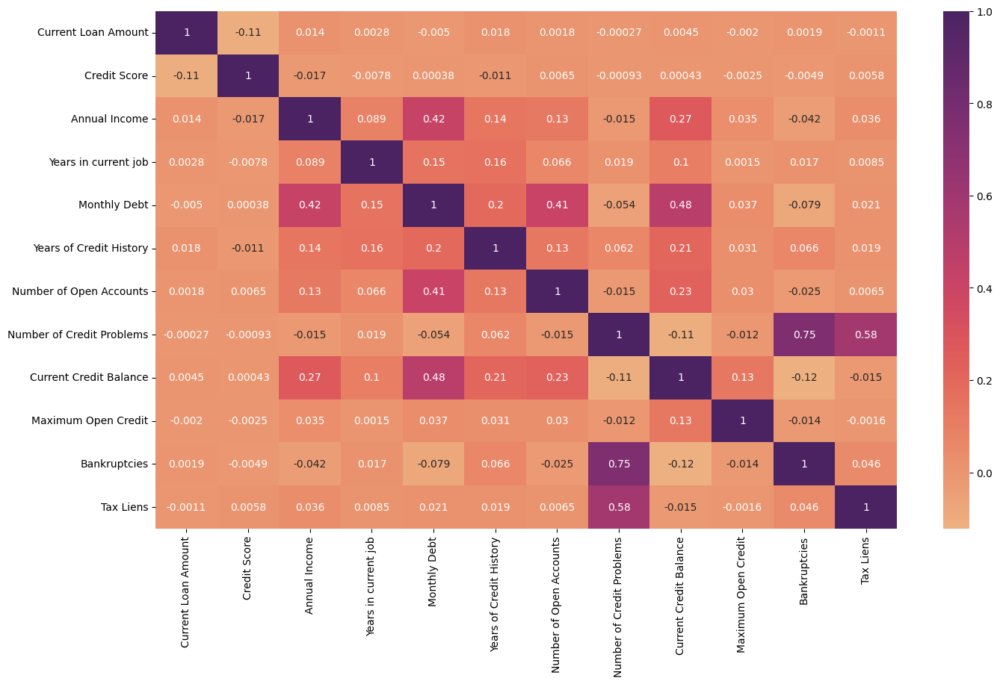

In [26]:
plt.figure(figsize=(16,9))
sns.heatmap(df.corr(),annot= True,cmap = 'flare')
plt.show()

In [27]:
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression 
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [28]:
# from sklearn.decomposition import PCA

# pca = PCA(n_components=0.9)
# pca.fit(X_train)
# print(pca.n_components_)
# #plot the explained variance 
# plt.plot(np.cumsum(pca.explained_variance_ratio_))
# plt.plot(pca.explained_variance_ratio_, 'o')
# # plt.plot(pca.explained_variance_ratio_, 'o')
# plt.title('Explained variance by number of components')
# plt.xlabel('Number of components')
# plt.ylabel('Cumulative explained variance')
# plt.show()


In [29]:
# printmd('## Shape of X_train and X_test')
# print(X_train.shape)
# print(X_test.shape)

# print(y_test.shape)
# print(y_train.shape)  

In [30]:
def model_eval(actual, pred):
    
    confusion = confusion_matrix(actual, pred)

    TP = confusion[1][1]
    TN = confusion[0][0]
    FP = confusion[0][1]
    FN = confusion[1][0]

    accuracy = ((TP+TN))/(TP+FN+FP+TN)
    precision = (TP)/(TP+FP)
    recall = (TP)/(TP+FN)
    f_measure = (2*recall*precision)/(recall+precision)
    sensitivity = TP / (TP + FN)
    specificity = TN / (TN + FP)
    error_rate = 1 - accuracy
    
    out = {}
    out['accuracy'] =  accuracy
    out['precision'] = precision
    out['recall'] = recall
    out['f_measure'] = f_measure
    out['sensitivity'] = sensitivity
    out['specificity'] = specificity
    out['error_rate'] = error_rate

    return out
    

## Counterfactual Generation

In [31]:
from FastCG.generators import ProbKnnGenerator


Logger level: 30


In [32]:
#implement normalization using StandardScaler and PCA 

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


In [33]:
df.drop(['Loan ID', 'Customer ID'], axis=1, inplace=True)
df["Loan Status"] = df["Loan Status"].astype('category')
df["Loan Status"] = df["Loan Status"].cat.codes
df.head()

,Loan Status,Current Loan Amount,Term,Credit Score,Annual Income,Years in current job,Home Ownership,Purpose,Monthly Debt,Years of Credit History,Number of Open Accounts,Number of Credit Problems,Current Credit Balance,Maximum Open Credit,Bankruptcies,Tax Liens
0,1,445412.00,Short Term,709.00,1167493.00,8.00,Home Mortgage,Home Improvements,5214.74,17.20,6.00,1.00,228190.00,416746.00,1.00,0.00
1,1,262328.00,Short Term,1130.83,1375894.39,10.00,Home Mortgage,Debt Consolidation,33295.98,21.10,35.00,0.00,229976.00,850784.00,0.00,0.00
2,1,99999999.00,Short Term,741.00,2231892.00,8.00,Own Home,Debt Consolidation,29200.53,14.90,18.00,1.00,297996.00,750090.00,0.00,0.00
3,1,347666.00,Long Term,721.00,806949.00,3.00,Own Home,Debt Consolidation,8741.90,12.00,9.00,0.00,256329.00,386958.00,0.00,0.00
4,1,176220.00,Short Term,1130.83,1375894.39,5.00,Rent,Debt Consolidation,20639.70,6.10,15.00,0.00,253460.00,427174.00,0.00,0.00


In [34]:
# df.drop_duplicates(subset=['Loan ID'], inplace=True)

In [35]:
X_train, X_test, y_train, y_test = train_test_split(df.drop(columns = ['Loan Status']), df['Loan Status'], test_size=0.2, random_state=0)

In [36]:
import lightgbm

for col in df.select_dtypes(include=['object']):
    X_test[col] = X_test[col].astype('category')
    X_train[col] = X_train[col].astype('category')

category_cols = df.select_dtypes(include=['category']).columns

fit_params={"early_stopping_rounds":10, 
            "eval_metric" : 'auc', 
            "eval_set" : [(X_test,y_test)],
            'eval_names': ['valid'],
            'verbose': 100,
            'feature_name': 'auto', # that's actually the default
            'categorical_feature': 'auto' # that's actually the default
           }

clf = lightgbm.LGBMClassifier(n_estimators=1000, learning_rate = 0.05, verbose= -1)

clf.fit(X_train, y_train, **fit_params)



[100]	valid's auc: 0.76799	valid's binary_logloss: 0.437485


LGBMClassifier(learning_rate=0.05, n_estimators=1000, verbose=-1)

In [37]:
config_new = {"features_to_change": ['Current Loan Amount', 'Term', 'Credit Score',
                                     'Annual Income'],
              "increase_only": ['Annual Income', 'Credit Score'], 
              "decrease_only": ['Monthly Debt'], 
              "max_features_to_change": 2,
              "target": 'Loan Status',
              "categorical_features": ['Term', 'Home Ownership', 'Purpose'],
              "feature_range": {"Current Loan Amount": [-0.5, 0.2], "Credit Score": [-0.5, 0.5]},
              }

from json import dumps

config_json = dumps(config_new)


In [38]:
from rich import print
repr(config_json)

'\'{"features_to_change": ["Current Loan Amount", "Term", "Credit Score", "Annual Income"], "increase_only": ["Annual Income", "Credit Score"], "decrease_only": ["Monthly Debt"], "max_features_to_change": 2, "target": "Loan Status", "categorical_features": ["Term", "Home Ownership", "Purpose"], "feature_range": {"Current Loan Amount": [-0.5, 0.2], "Credit Score": [-0.5, 0.5]}}\''

In [39]:
from FastCG.generators import ProbKnnGenerator
# from FastCG_NG.generators.ProbKnnGenerator import ProbKnnGenerator as ProbKnnGenerator_NG

In [40]:
# step four - create a generator  

cfg_generator = ProbKnnGenerator(df,clf,config_json,target=1,condition='==',verbose=1) 

# step five - generate the counterfactual

valid_ng, invalid_ng = cfg_generator.generate(X_test[0:300],n_jobs=1,chunk_size=100) 

# valid_ng,invalid_ng = pk_ng.generate(X_test,n_jobs=1,chunk_size=100)

[07-18 13:19:19] SmartCondition.py:25 (__init__) INFO - Initializing SmartCondition with target: 1 and condition: ==
[07-18 13:19:19] ProbKnnGenerator.py:45 (_preprocess_all_data) INFO - Features to use: ['Current Loan Amount', 'Term', 'Credit Score', 'Annual Income']
[07-18 13:19:19] ProbKnnGenerator.py:46 (_preprocess_all_data) INFO - Features to increase: ['Annual Income', 'Credit Score']
[07-18 13:19:19] ProbKnnGenerator.py:47 (_preprocess_all_data) INFO - Features to decrease: ['Monthly Debt']
[07-18 13:19:19] ProbKnnGenerator.py:55 (_preprocess_all_data) INFO - You have provided the following categorical features: ['Term', 'Home Ownership', 'Purpose']
[07-18 13:19:19] util_functions.py:40 (choose_pca_components) INFO - Assuming data is already normalized


Updated logger level to 20


Checking chunks for counterfactual targets in sequencial: 100%|██████████| 3/3 [00:02<00:00,  1.10it/s]
[07-18 13:19:26] GeneratorBase.py:263 (generate) INFO - Total data to generate: 20
Generating Counterfactuals in chunks in sequencial: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]
[07-18 13:19:27] GeneratorBase.py:274 (generate) INFO - Total generated data: 20
Postprocessing valid data in sequencial: 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]


In [41]:
len(valid_ng)

3

In [42]:
valid_ng

{11299:        Current Loan Amount  Credit Score  Annual Income  Years in current job  \
 11299            365694.08       1701.90     2570942.16                  9.00   
 
        Monthly Debt  Years of Credit History  Number of Open Accounts  \
 11299      13176.40                     5.90                     7.00   
 
        Number of Credit Problems  Current Credit Balance  Maximum Open Credit  \
 11299                       3.00               170202.00            260700.00   
 
        Bankruptcies  Tax Liens       ID        Term Home Ownership  \
 11299          0.00       3.00 11299.00  Short Term  Home Mortgage   
 
              Purpose  
 11299  Business Loan  ,
 95140:        Current Loan Amount  Credit Score  Annual Income  Years in current job  \
 95140            549061.70       1701.90     2570942.16                  3.00   
 
        Monthly Debt  Years of Credit History  Number of Open Accounts  \
 95140      11168.18                    10.40                    13.00 

In [43]:
# pk = ProbKnn(df, knn_, config_new, target_class=1)
# counter_factuals = pk.generate_mulitple_counterfactuals_parallel(X_test, n_jobs=-1)

keys = list(valid_ng.keys())
# print("Generated counterfactuals for {} instances".format(len(counter_factuals))) 
print("Generated counterfactuals for {} instances".format(len(keys)))


Generated counterfactuals for 3 instances

In [44]:
for k in keys[0:3]:
    cfg_generator.show_counterfactual(k, valid_ng, show_plot=False)

-------------------------------------------------------------------
ID:  11299
-------------------------------------------------------------------
Current Loan Amount  changed from  304238.0  to  365694.0
Increase  Current Loan Amount  by  20.2 %
Increase  Current Loan Amount  by  61456.0  units
Credit Score  changed from  1130.0  to  1701.0
Increase  Credit Score  by  50.53 %
Increase  Credit Score  by  571.0  units
Annual Income  changed from  1375894.0  to  2570942.0
Increase  Annual Income  by  86.86 %
Increase  Annual Income  by  1195048.0  units
Years in current job  changed from  9.0  to  9.0
Monthly Debt  changed from  26619.0  to  13176.0
Decrease  Monthly Debt  by  -50.5 %
Decrease  Monthly Debt  by  -13443.0  units
Years of Credit History  changed from  5.0  to  5.0
Number of Open Accounts  changed from  7.0  to  7.0
Number of Credit Problems  changed from  3.0  to  3.0
Current Credit Balance  changed from  170202.0  to  170202.0
Maximum Open Credit  changed from  260700.0  

,Original,Counterfactual,Difference,% Difference
Current Loan Amount,304238.0,365694.0,61456.00,20.20
Credit Score,1130.0,1701.0,571.00,50.53
Annual Income,1375894.0,2570942.0,1195048.00,86.86
Years in current job,9.0,9.0,0.00,0.00
Monthly Debt,26619.0,13176.0,-13443.00,-50.50
Years of Credit History,5.0,5.0,0.00,0.00
Number of Open Accounts,7.0,7.0,0.00,0.00
Number of Credit Problems,3.0,3.0,0.00,0.00
Current Credit Balance,170202.0,170202.0,0.00,0.00
Maximum Open Credit,260700.0,260700.0,0.00,0.00


-------------------------------------------------------------------
ID:  95140
-------------------------------------------------------------------
Current Loan Amount  changed from  517176.0  to  549061.0
Increase  Current Loan Amount  by  6.17 %
Increase  Current Loan Amount  by  31885.0  units
Credit Score  changed from  1130.0  to  1701.0
Increase  Credit Score  by  50.53 %
Increase  Credit Score  by  571.0  units
Annual Income  changed from  1375894.0  to  2570942.0
Increase  Annual Income  by  86.86 %
Increase  Annual Income  by  1195048.0  units
Years in current job  changed from  3.0  to  3.0
Monthly Debt  changed from  22562.0  to  11168.0
Decrease  Monthly Debt  by  -50.5 %
Decrease  Monthly Debt  by  -11394.0  units
Years of Credit History  changed from  10.0  to  10.0
Number of Open Accounts  changed from  13.0  to  13.0
Number of Credit Problems  changed from  0.0  to  0.0
Current Credit Balance  changed from  0.0  to  0.0
Maximum Open Credit  changed from  0.0  to  0.0
Ban

,Original,Counterfactual,Difference,% Difference
Current Loan Amount,517176.0,549061.0,31885.00,6.17
Credit Score,1130.0,1701.0,571.00,50.53
Annual Income,1375894.0,2570942.0,1195048.00,86.86
Years in current job,3.0,3.0,0.00,0.00
Monthly Debt,22562.0,11168.0,-11394.00,-50.50
Years of Credit History,10.0,10.0,0.00,0.00
Number of Open Accounts,13.0,13.0,0.00,0.00
Number of Credit Problems,0.0,0.0,0.00,0.00
Current Credit Balance,0.0,0.0,0.00,0.00
Maximum Open Credit,0.0,0.0,0.00,0.00


-------------------------------------------------------------------
ID:  72081
-------------------------------------------------------------------
Current Loan Amount  changed from  404690.0  to  347095.0
Decrease  Current Loan Amount  by  -14.23 %
Decrease  Current Loan Amount  by  -57595.0  units
Credit Score  changed from  645.0  to  721.0
Increase  Credit Score  by  11.78 %
Increase  Credit Score  by  76.0  units
Annual Income  changed from  792794.0  to  807090.0
Increase  Annual Income  by  1.8 %
Increase  Annual Income  by  14296.0  units
Years in current job  changed from  7.0  to  7.0
Monthly Debt  changed from  18432.0  to  9123.0
Decrease  Monthly Debt  by  -50.5 %
Decrease  Monthly Debt  by  -9309.0  units
Years of Credit History  changed from  7.0  to  7.0
Number of Open Accounts  changed from  5.0  to  5.0
Number of Credit Problems  changed from  0.0  to  0.0
Current Credit Balance  changed from  156560.0  to  156560.0
Maximum Open Credit  changed from  192456.0  to  1924

,Original,Counterfactual,Difference,% Difference
Current Loan Amount,404690.0,347095.0,-57595.00,-14.23
Credit Score,645.0,721.0,76.00,11.78
Annual Income,792794.0,807090.0,14296.00,1.80
Years in current job,7.0,7.0,0.00,0.00
Monthly Debt,18432.0,9123.0,-9309.00,-50.50
Years of Credit History,7.0,7.0,0.00,0.00
Number of Open Accounts,5.0,5.0,0.00,0.00
Number of Credit Problems,0.0,0.0,0.00,0.00
Current Credit Balance,156560.0,156560.0,0.00,0.00
Maximum Open Credit,192456.0,192456.0,0.00,0.00
